In [1]:
import pandas as pd
import seaborn as sns
import requests as re
import matplotlib.pyplot as plt
import csv

from io import StringIO
from datetime import datetime

In [2]:
from IPython.display import HTML

HTML('''<script>
code_show=true; 
function code_toggle() {
 if (code_show){
 $('div.input').hide();
 } else {
 $('div.input').show();
 }
 code_show = !code_show
} 
$( document ).ready(code_toggle);
</script>
<form action="javascript:code_toggle()"><input type="submit" value="Click here to toggle on/off the raw code."></form>''')

In [2]:
r = re.get('http://api.clubelo.com/ManCity')
r.status_code

200

In [3]:
r.text

'Rank,Club,Country,Level,Elo,From,To\nNone,Man City,ENG,2,1365.06604004,1946-07-07,1946-09-04\nNone,Man City,ENG,2,1372.48046875,1946-09-05,1946-09-07\nNone,Man City,ENG,2,1369.61376953,1946-09-08,1946-09-14\nNone,Man City,ENG,2,1383.73388672,1946-09-15,1946-09-18\nNone,Man City,ENG,2,1385.57836914,1946-09-19,1946-09-21\nNone,Man City,ENG,2,1397.73913574,1946-09-22,1946-09-28\nNone,Man City,ENG,2,1400.17541504,1946-09-29,1946-09-29\nNone,Man City,ENG,2,1417.17541504,1946-09-30,1946-10-03\nNone,Man City,ENG,2,1423.17541504,1946-10-04,1946-10-05\nNone,Man City,ENG,2,1416.77331543,1946-10-06,1946-10-12\nNone,Man City,ENG,2,1421.00708008,1946-10-13,1946-10-19\nNone,Man City,ENG,2,1417.05310059,1946-10-20,1946-10-26\nNone,Man City,ENG,2,1411.58740234,1946-10-27,1946-11-02\nNone,Man City,ENG,2,1424.09020996,1946-11-03,1946-11-09\nNone,Man City,ENG,2,1415.28759766,1946-11-10,1946-11-16\nNone,Man City,ENG,2,1435.94812012,1946-11-17,1946-11-23\nNone,Man City,ENG,2,1444.91845703,1946-11-24,1946-

## Formatting request data

In [4]:
data = StringIO(r.text)
df = pd.read_csv(data, sep=",")#turnig api information into pandas df
df.head()

,Rank,Club,Country,Level,Elo,From,To
0,None,Man City,ENG,2,1365.066040,1946-07-07,1946-09-04
1,None,Man City,ENG,2,1372.480469,1946-09-05,1946-09-07
2,None,Man City,ENG,2,1369.613770,1946-09-08,1946-09-14
3,None,Man City,ENG,2,1383.733887,1946-09-15,1946-09-18
4,None,Man City,ENG,2,1385.578369,1946-09-19,1946-09-21


In [5]:
df.dtypes
#we need to change the from and to columns to work with them

Rank        object
Club        object
Country     object
Level        int64
Elo        float64
From        object
To          object
dtype: object

In [6]:
df.columns

Index(['Rank', 'Club', 'Country', 'Level', 'Elo', 'From', 'To'], dtype='object')

In [7]:
df['From'] = pd.to_datetime(df['From'])
df['To'] = pd.to_datetime(df['To'])

findfont: Font family ['Arial Rounded MT Bold'] not found. Falling back to DejaVu Sans.


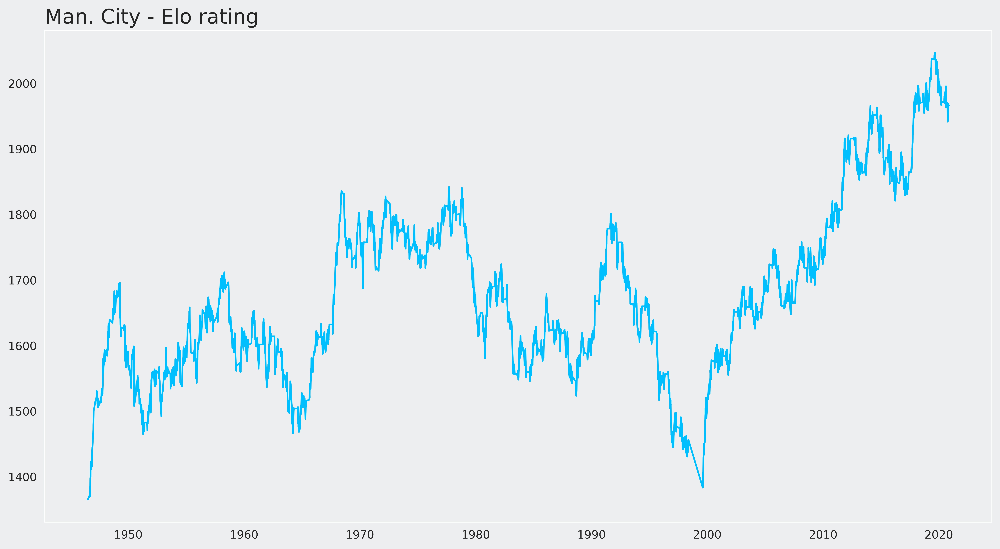

In [20]:
#setting visual style of the chart

##first try

sns.set_style("dark")
fig = plt.figure(num=None, figsize=(15, 8), dpi=600)
axes = fig.add_subplot(1,1,1, facecolor='#edeeef')
fig.patch.set_facecolor('#edeeef')

#plot
plt.plot_date(df.From, df.Elo, '-', color="deepskyblue")

#title
plt.title('Man. City - Elo rating', loc= 'left', fontsize=18, fontname="Arial Rounded MT Bold")

plt.show()

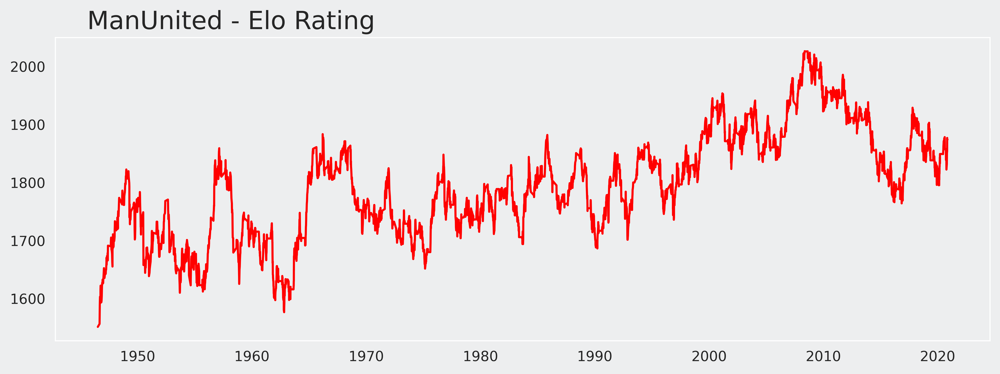

In [45]:
eloMaker('ManUnited', 'red')

## Man utd vs city

We can see when it was purchase by saudi prince that started to 
inject money and the growth of the club its exponential

on the other side of the city is the Man Utd who its more stable
on their ranking something obvious since it was one of the most valuable
teams and it is one of the most popular around the world, but lately we can see
how their playing hability has decresased in the last decade we can see clearly 
who the king on Manchester is right now.

In [20]:
def eloMaker(team, colour = "dimgray"):
    r = re.get('http://api.clubelo.com/' + str(team))
    data = StringIO(r.text)
    df = pd.read_csv(data, sep=",")
    
    df.From = pd.to_datetime(df['From'])
    df.To = pd.to_datetime(df['To'])
    
    sns.set_style("dark")
    fig = plt.figure(num=None, figsize=(12, 4), dpi=600)
    axes = fig.add_subplot(1, 1, 1, facecolor='#edeeef')
    fig.patch.set_facecolor('#edeeef')    
    plt.plot_date(df.From, df.Elo,'-', color = colour)
    plt.title("    " + str(team) + " - Elo Rating", loc="left",  fontsize=18, fontname="Arial Rounded MT Bold")
    
    plt.show()
    
    

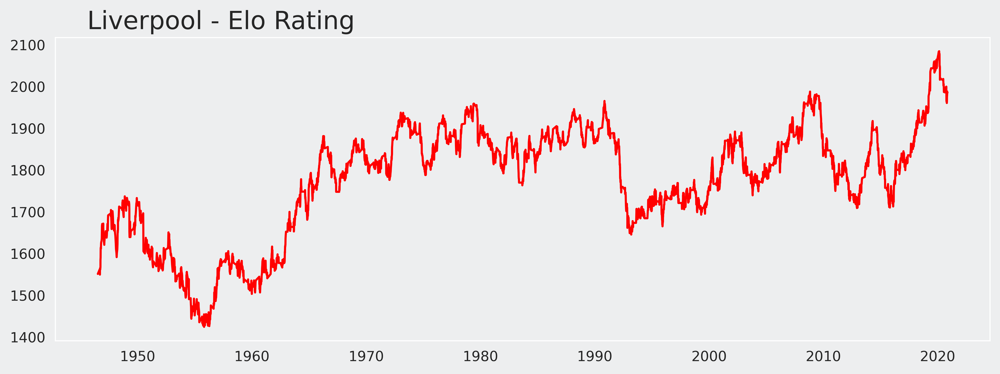

In [21]:
eloMaker('Liverpool', 'red')

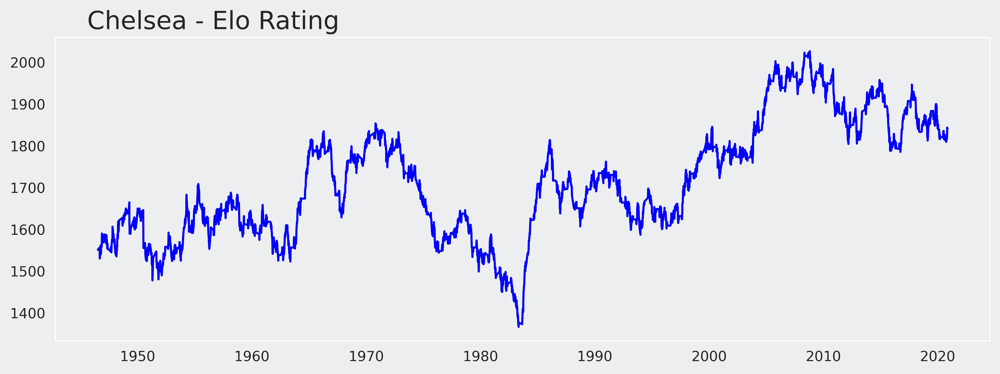

In [38]:
eloMaker('Chelsea', 'blue')

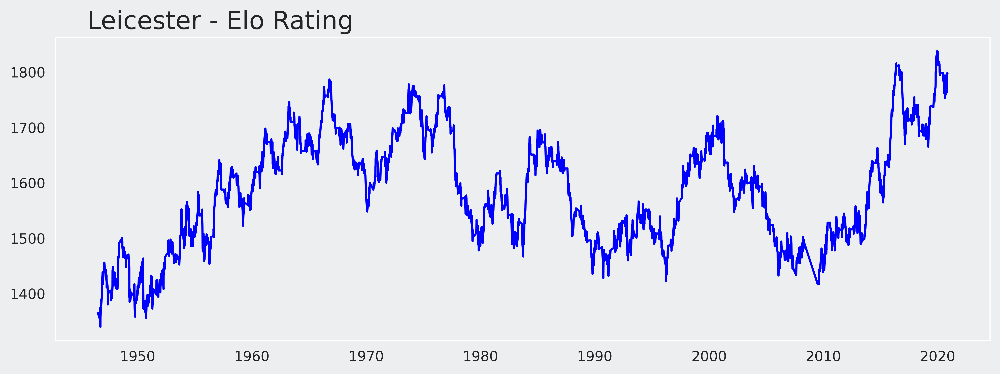

In [42]:
eloMaker('Leicester', 'blue')

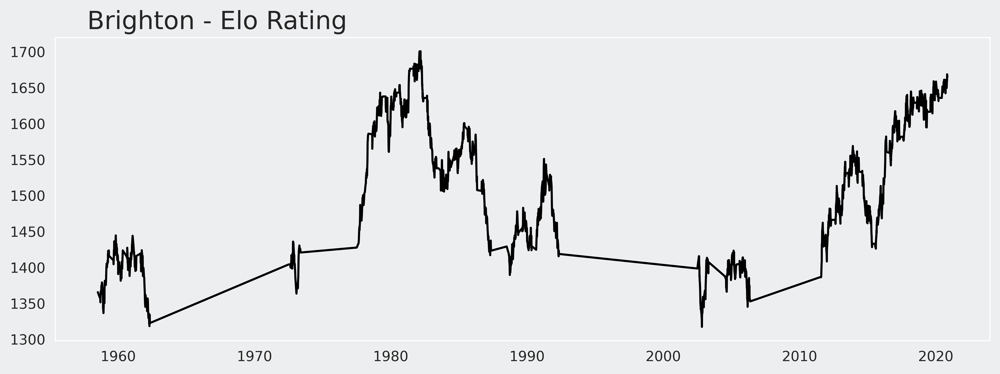

In [46]:
eloMaker('Brighton', 'black')

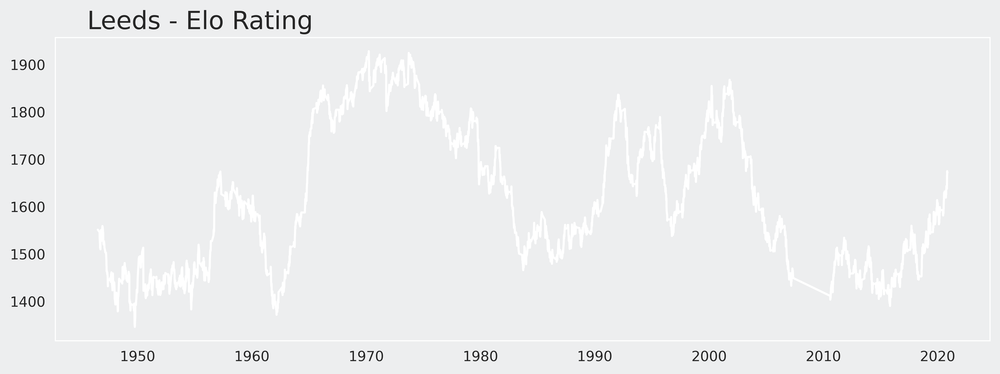

In [47]:
eloMaker('Leeds', 'white')

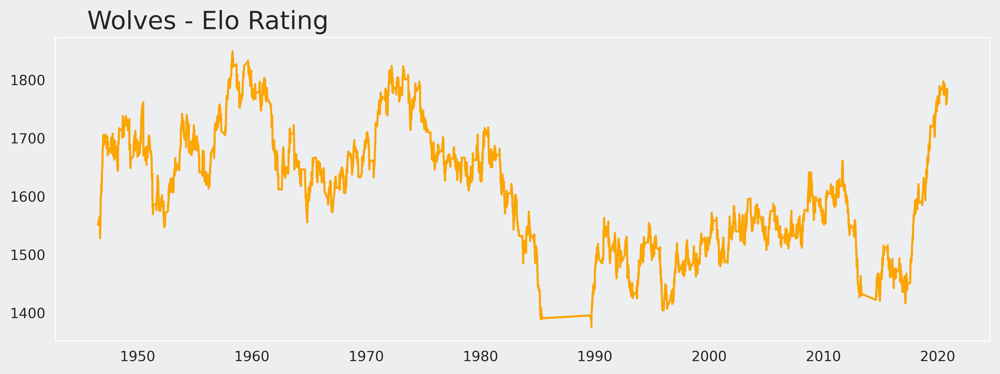

In [48]:
eloMaker('Wolves', 'orange')

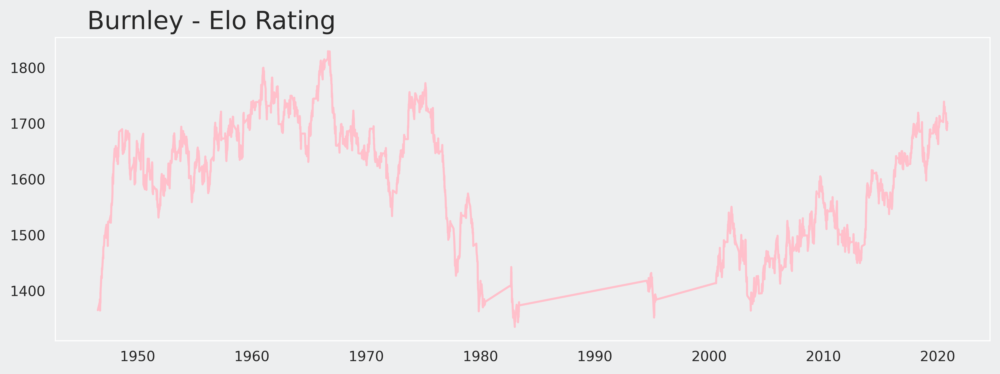

In [49]:
eloMaker('Burnley', 'pink')

## Relegated teams comparasion 19-20

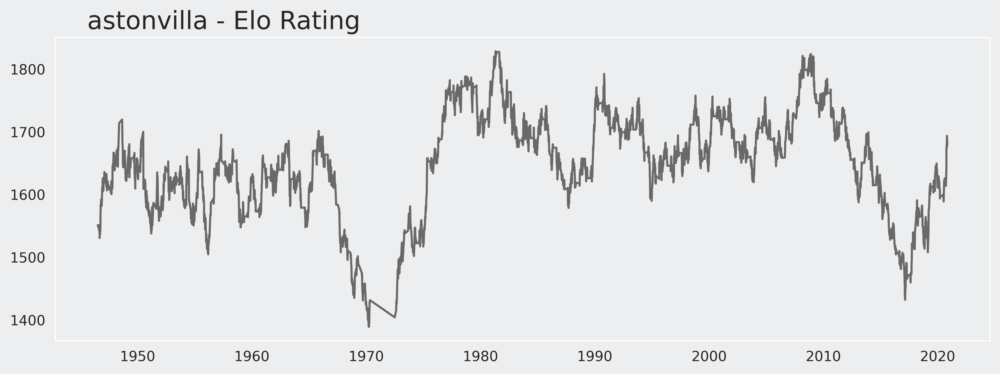

In [75]:
eloMaker('astonvilla')

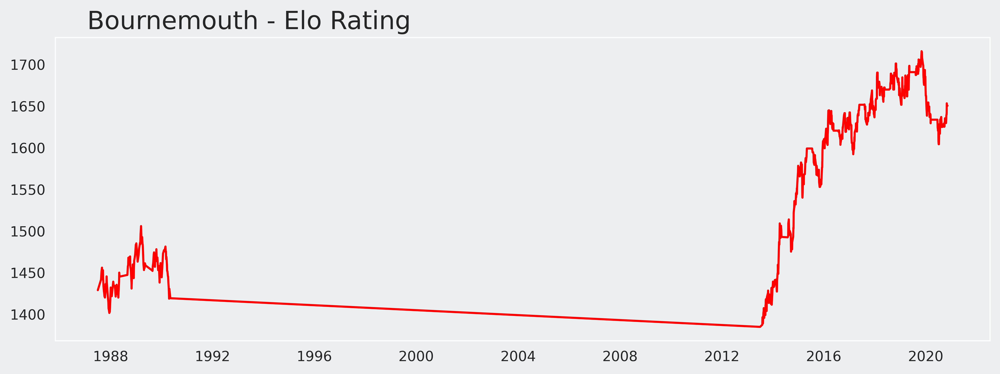

In [64]:
eloMaker('Bournemouth', 'red')

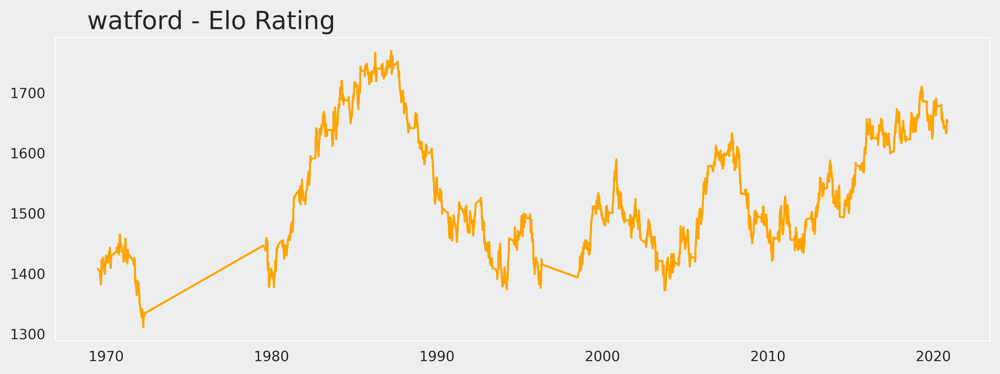

In [63]:
eloMaker('watford', 'orange')

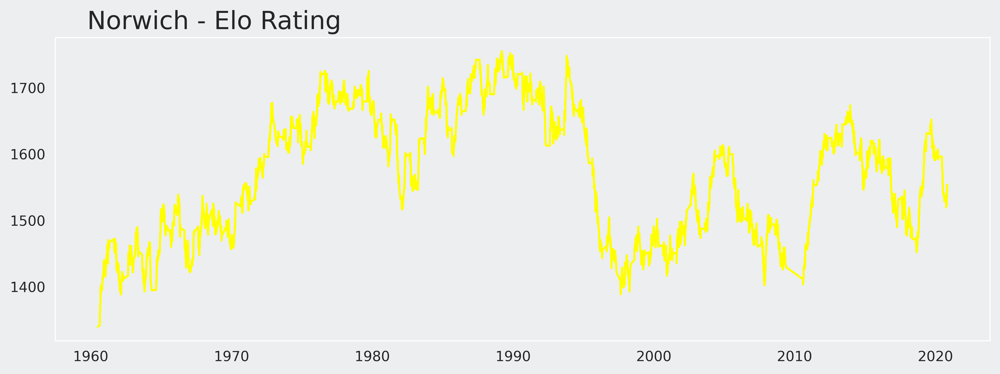

In [62]:
eloMaker('Norwich', 'yellow')

## Relegated teams 18-19

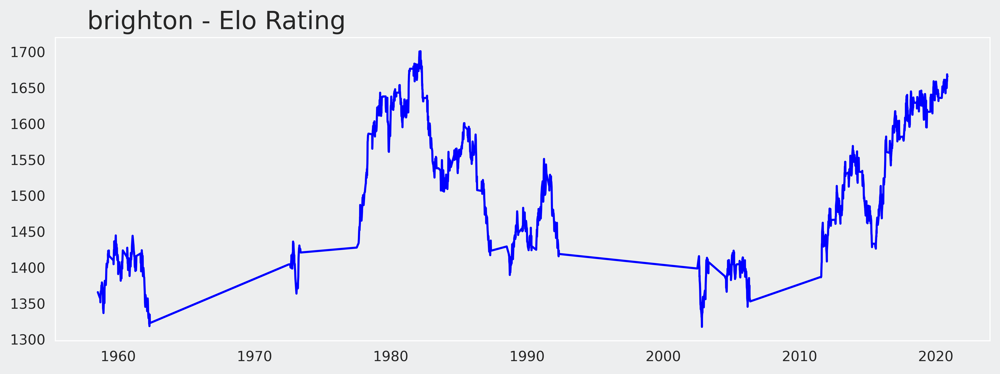

In [65]:
#almost relegated
#17

eloMaker('brighton', 'blue')

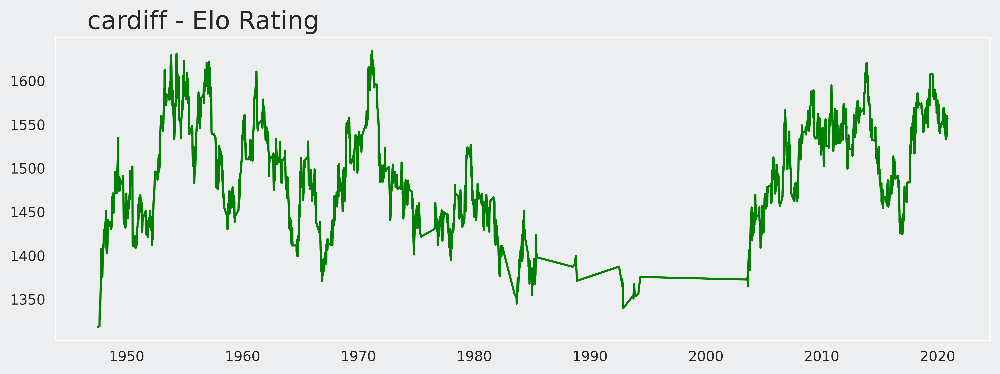

In [66]:
#18

eloMaker('cardiff', 'green')

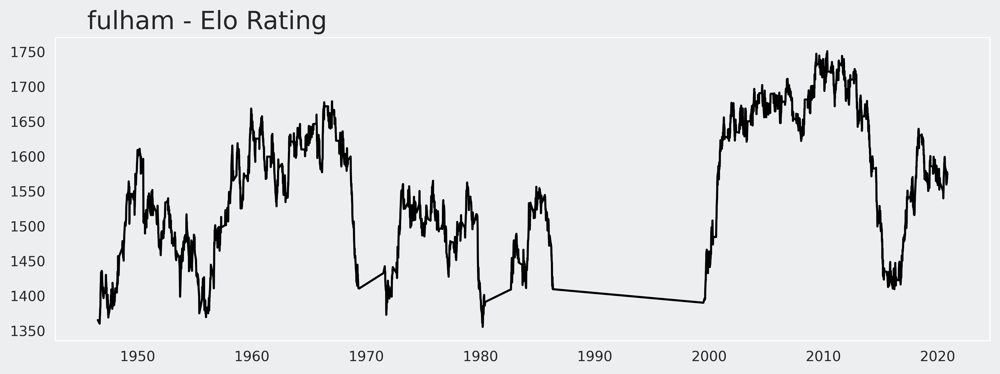

In [67]:
#19
eloMaker('fulham', 'black')

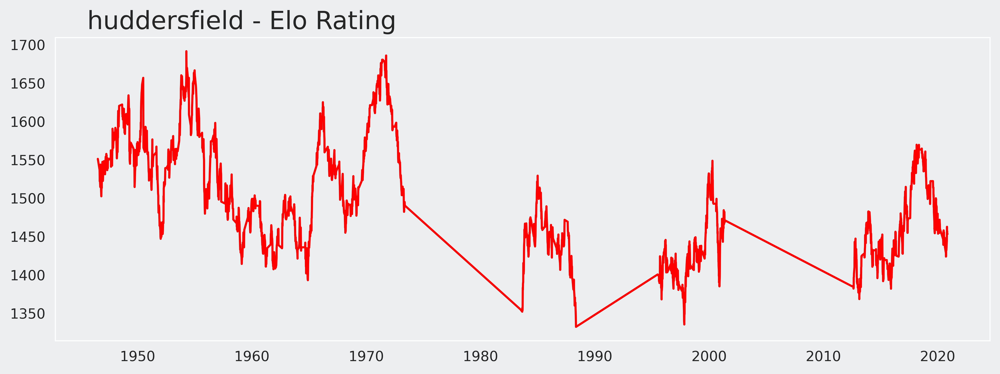

In [69]:
#20

eloMaker('huddersfield', 'red')

## Relegated 17-18


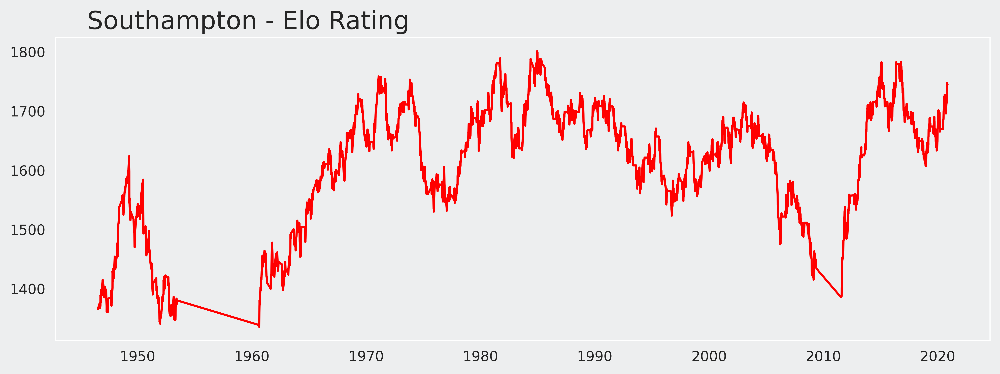

In [70]:
#17
eloMaker('Southampton', 'red')

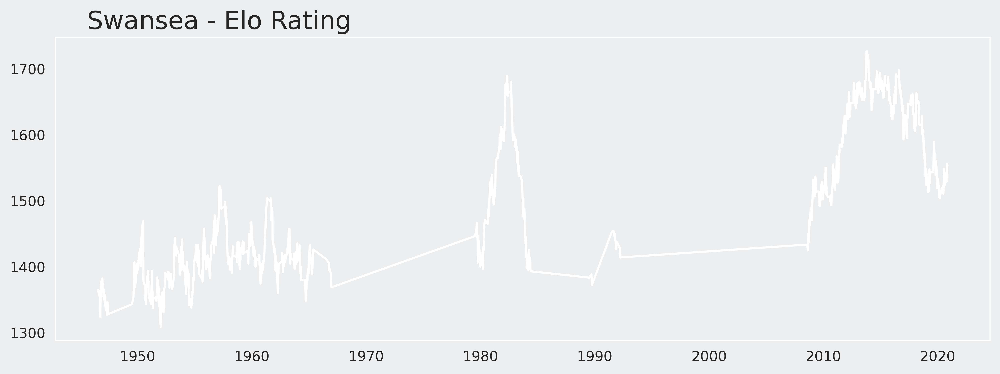

In [71]:
#18
eloMaker('Swansea', 'white')

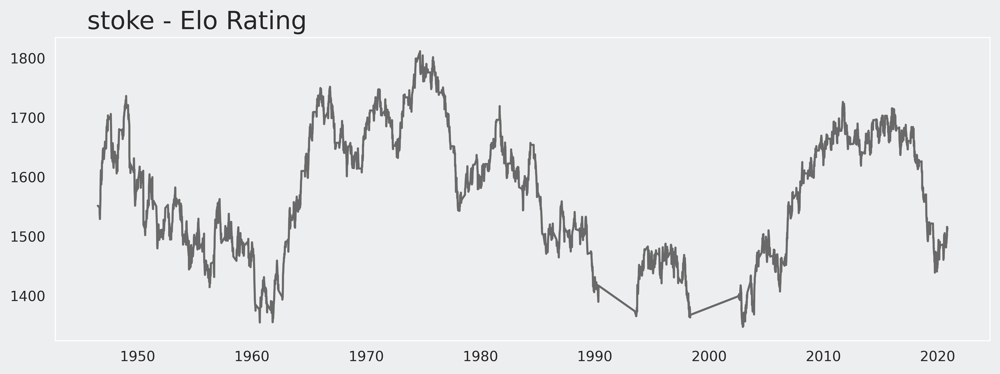

In [72]:
#19
eloMaker('stoke')

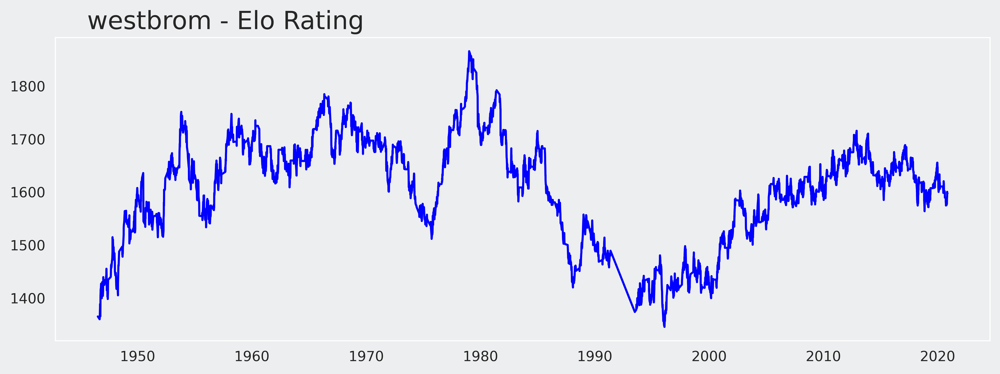

In [74]:
#20
eloMaker('westbrom', 'blue')

A curious thing that I saw it is that eventhough teams get relegated they still 
have the same, characteristic, few sesons growing really fast, to collapse when they reach 
the highest level

## VS SPAIN 

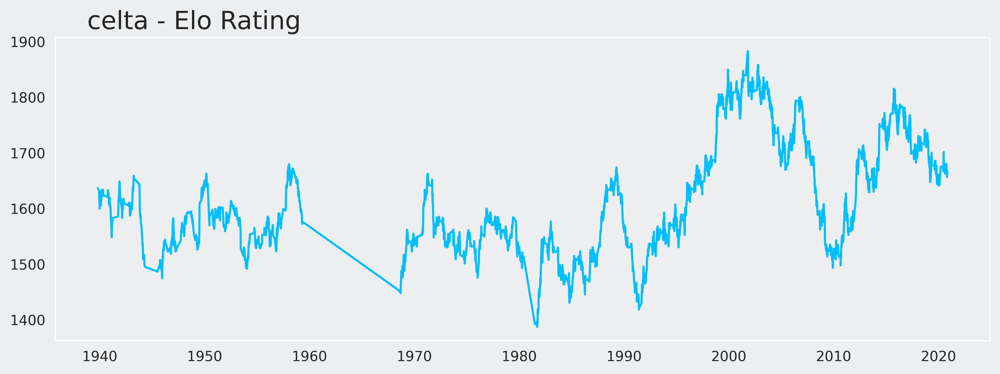

In [76]:
eloMaker('celta', 'deepskyblue')

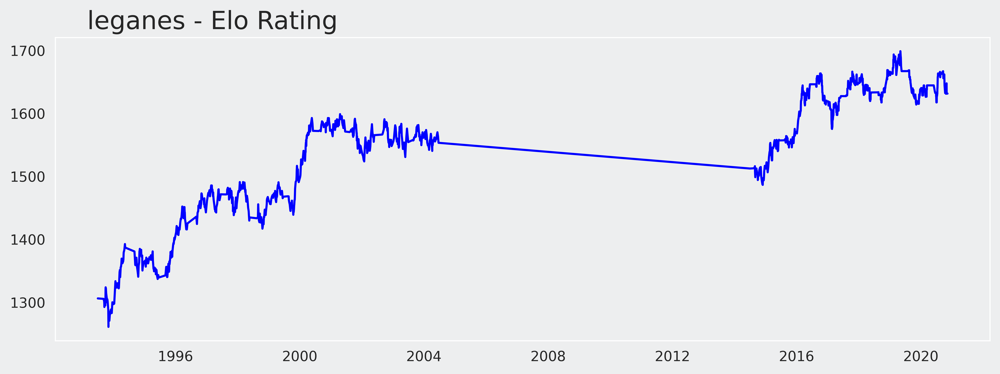

In [77]:
eloMaker('leganes', 'blue')

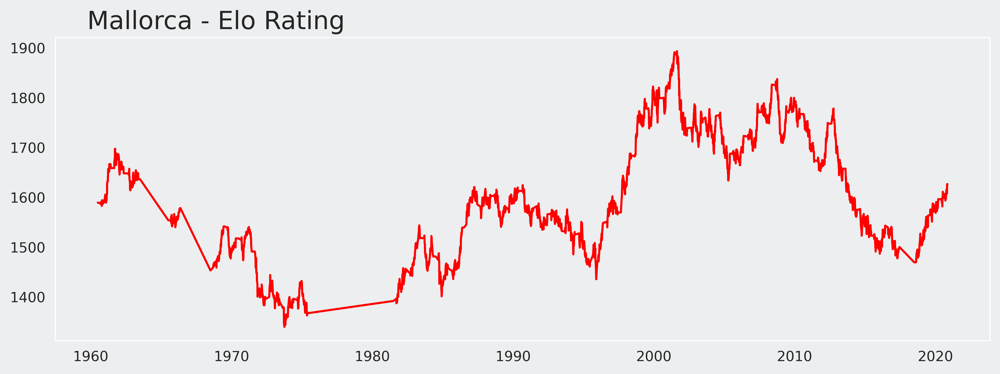

In [78]:
eloMaker('Mallorca','red')

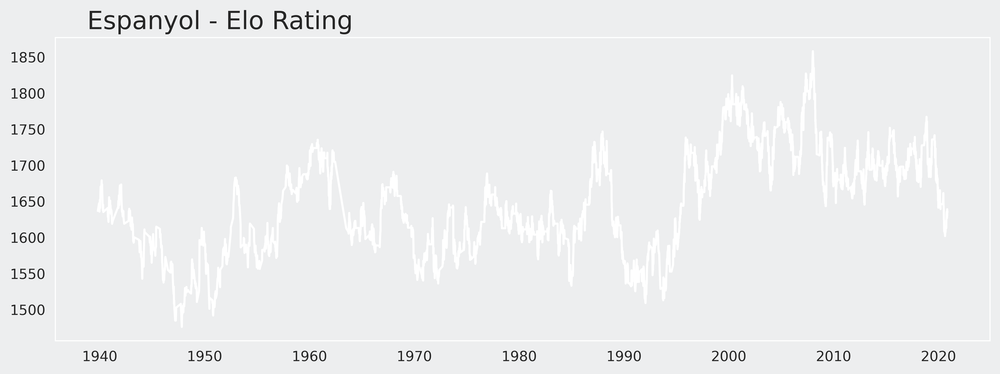

In [79]:
eloMaker('Espanyol', 'white')

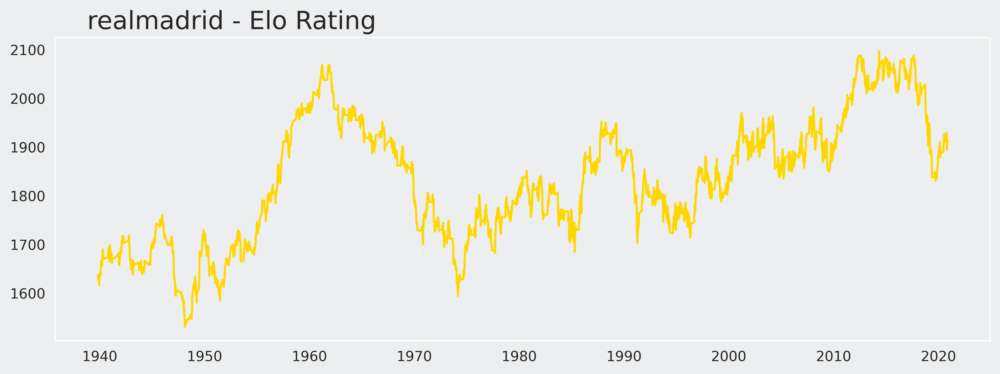

In [80]:
eloMaker('realmadrid', 'gold')

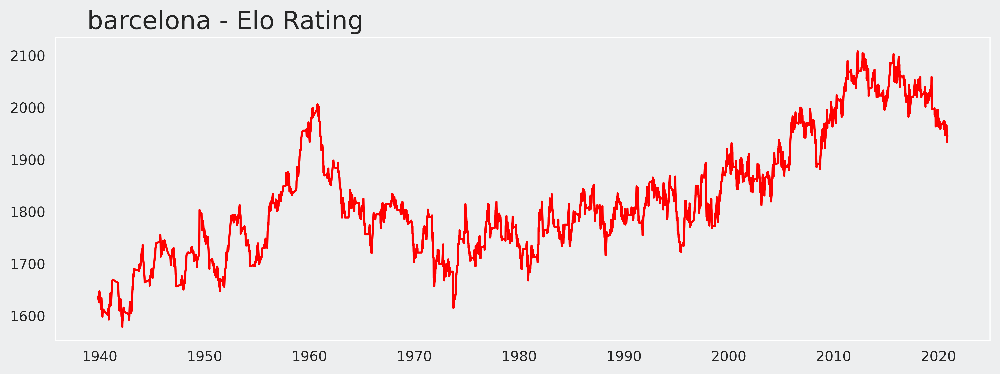

In [81]:
eloMaker('barcelona', 'red')

Just out of curiosity, since journalist still claim that La Liga is still 
the best league in the world I compared the elo ratings from all these years
and while, EPL teams that go to second division the rating goes down 
dramatically faster than in La Liga, posssibly because they tend to make big
signings once they reach EPL, and as soon as the team goes down, players
know they have to leave while in Spain teamstend to keep players even if 
they go back to second division.